# Exploration.17 - Pix2Pix_U-Net_채색하기

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## import Package

In [ ]:
import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt
import seaborn as sns

import cv2

import os


print(np.__version__)
print(tf.__version__)

1.21.5
2.8.0


## 데이터 불러오기

In [ ]:
file_path_train = '/content/drive/MyDrive/Colab Notebooks/Exploration/Exploration.17_GAN_Pix2Pix_U-Net/data/train/'
file_path_val = '/content/drive/MyDrive/Colab Notebooks/Exploration/Exploration.17_GAN_Pix2Pix_U-Net/data/val/'

print("number of train examples :", len(os.listdir(file_path_train)))
print("number of val examples :", len(os.listdir(file_path_val)))

number of train examples : 1000
number of val examples : 5


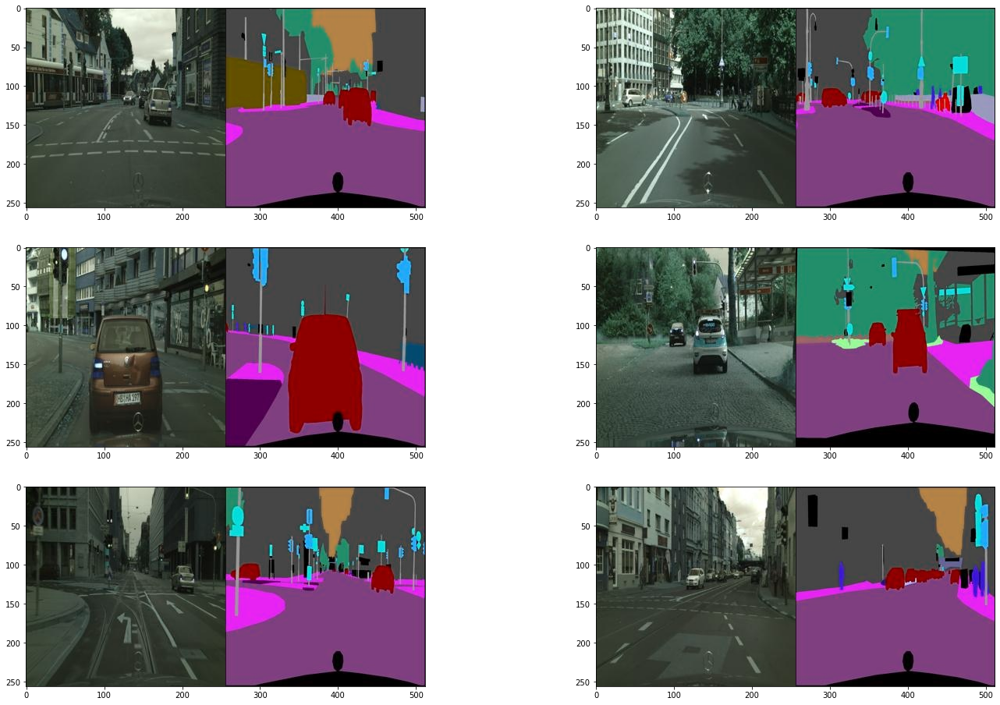

In [ ]:
plt.figure(figsize=(24,16))
for i in range(1, 7):
    f = file_path_train + os.listdir(file_path_train)[np.random.randint(1000)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

In [ ]:
f = file_path_train + os.listdir(file_path_train)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


- 이미지 사이즈 (256, 256) * 2
- 채널 : 3

## 이미지 분할
- 원본 이미지와 채색해야할 이미지로 분할

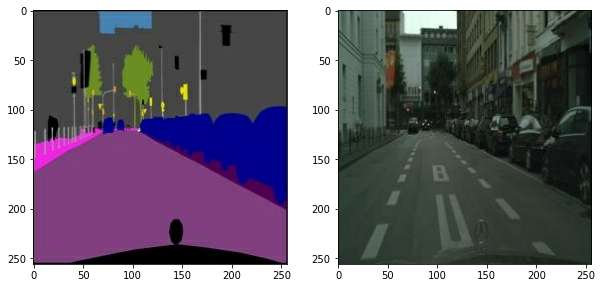

In [ ]:
def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1  # 0~255의 픽셀값을 -1~1로 변환함

def denormalize(x):
    x = (x+1)*127.5  # -1~1로 변환된 픽셀값을 기존의 0~255의 값으로 변환함
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2   # tf.shape(img) : (256, 512, 3)   # tf.shape(img)[1] : 512
    colored = img[:, :w, :] 
    colored = tf.cast(colored, tf.float32)
    sketch = img[:, w:, :] 
    sketch = tf.cast(sketch, tf.float32)
    return normalize(sketch), normalize(colored)

f = file_path_train + os.listdir(file_path_train)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

- tf.cast()
    - 배열의 dtype을 변경
    
https://shwoghk14.blogspot.com/2020/03/tensorflow-tfcast.html

## augmentation
- 학습에 사용할 수 있는 데이터의 수는 약 1,000개
- 데이터가 너무 적으므로 학습에 사용하는 데이터의 다양성을 높여야 함

In [ ]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)  # axis=-1이므로 채널에 해당하는 2번째 디멘젼으로 sketch와 colored를 결합
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:    # 50% 확률
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])  # 임의로 size만큼 crop해줌 (잘라줌)
    
    out = image.random_flip_left_right(out)  # 랜덤으로 좌우 반전
    
    return out[...,:3], out[...,3:]   # 3채널 + 3채널 된 stacked를 3채널(sketch), 3채널(colored)로 분리

- augmentation 방법
    - crop
    - 좌우 반전

- tf.random.uniform()
    - 원하는 형태의 랜덤 값을 가진 배열을 만듦
    
https://shwoghk14.blogspot.com/2020/03/tensorflow-tfrandomuniform.html

- tf.pad()
    - tensor를 지정한 paddings에 따라 채움

https://runebook.dev/ko/docs/tensorflow/pad

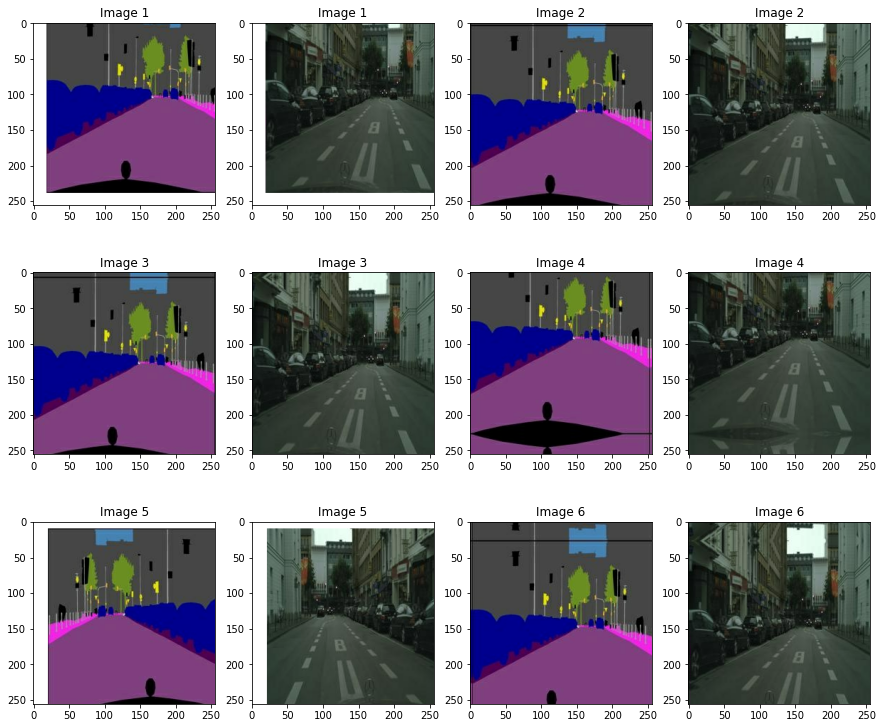

In [ ]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

- crop과 좌우반전이 잘 이뤄진 것을 확인함

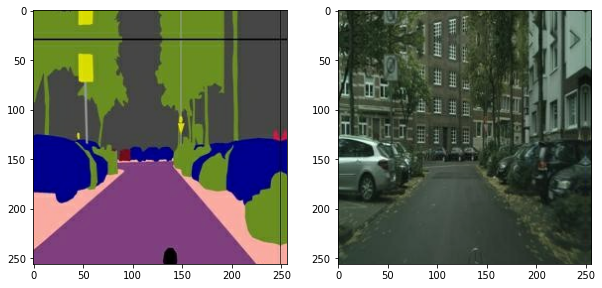

In [ ]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(file_path_train + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

## Pix2Pix
- 일반적인 GAN : 기존 노이즈 입력을 이미지로 변환
- Pix2Pix : 이미지를 입력으로 하여 원하는 다른 형태의 이미지로 변환시킬 수 있는 GAN 모델

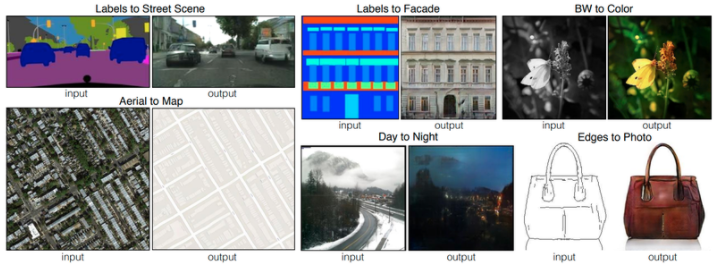

- cGAN
    - 노이즈와 레이블 정보를 함께 입력
    - fully-connected 레이어를 연속적으로 쌓아 만듦
- Pix2Pix
    - 이미지 변환이 목적
    - 이미지를 다루는데 효율적인 convolution 레이어를 활용

## Pix2Pix Generator 구현

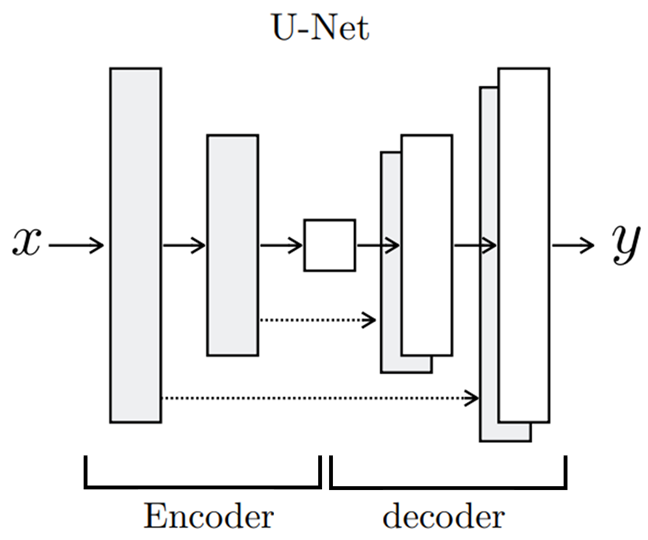

- Generator는 어떠한 이미지를 입력받아 변환된 이미지를 출력하기 위해 사용
- 입력 이미지와 변환된 이미지의 크기는 동일해야 함
- Encoder-Decoder 구조
    - Encoder에서 입력 이미지(x)를 받으면 단계적으로 이미지를 down-sampling 하면서 입력 이미지의 중요한 representation을 학습
    - Decoder에서는 이를 이용해 반대로 다시 이미지를 up-sampling하여 입력 이미지와 동일한 크기의 변환된 이미지(y)를 생성
    - Encoder의 최종 출력
        - bottleneck
        - 입력 이미지(x)의 가장 중요한 특징만을 담고 있음

- U-Net 구조
    - 각 레이어마다 Encoder와 Decoder가 연결(skip connection)되어 있음
    - Decoder가 변환된 이미지를 더 잘 생성하도록 Encoder로부터 더 많은 추가 정보를 이용하는 방법
    - 비교적 선명한 결과를 얻을 수 있음

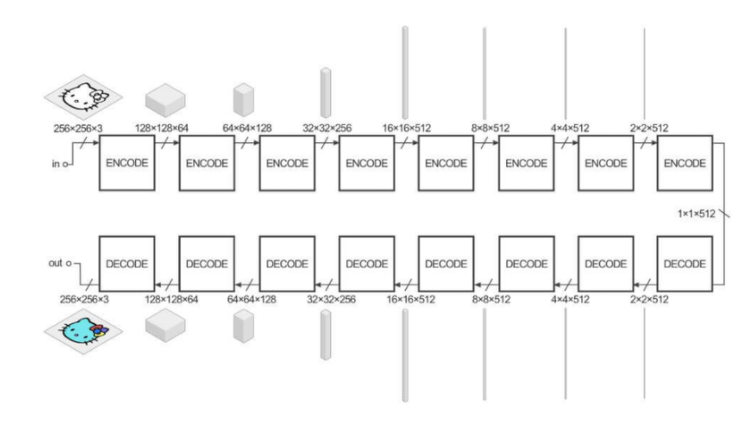

### 1. Encoder

In [ ]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

- filter size : (4,4)
- stride : 2
- padding : same

### 2. Decoder

In [ ]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

- Encoder의 input shape와 동일하게 (256, 256, 3)으로 결과물을 얻음

### 3. U-Net Generator 구현

In [ ]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []  # Encoder 과정을 리스트로 담음
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []  # Decoder 과정을 리스트로 담음
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]  # Encoder의 마지막은 Decoder에 입력으로 직접 들어가기 때문에 skip connection에서 제외함
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):  # Decoder는 Encoder의 역순과 연결되어야함, features[::-1] : Encoder의 역순으로 나열
            x = block(x)
            x = layers.Concatenate()([x, feat])  # layers.Concatenate() : 별다른 설정이 없다면 가장 마지막 축(채널 축)을 기준으로 서로 연결
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [ ]:
a = [0,1,2,3,4,5]

In [ ]:
a[::-1]

[5, 4, 3, 2, 1, 0]

In [ ]:
generator = UNetGenerator()
generator.get_summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block (EncodeBlock)     (None, 128, 128, 64  3072        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_1 (EncodeBlock)   (None, 64, 64, 128)  131584      ['encode_block[0][0]']           
                                                                                              

### 4. U-Net Discriminator 구현

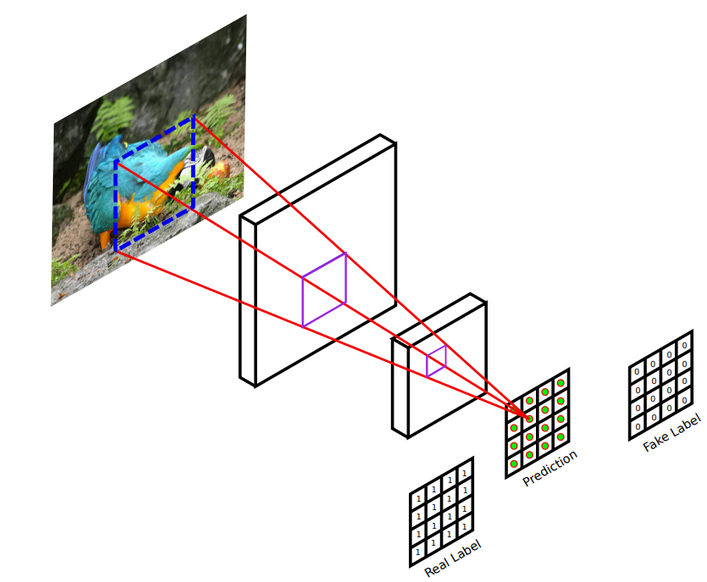

- Pix2Pix Discriminator
    - 하나의 이미지가 Discriminator의 입력으로 들어오면, convolution 레이어를 거쳐 확률 값을 나타내는 최종 결과를 생성
    - 그 결과는 하나의 값이 아닌 여러 개의 값을 갖음
    - receptive field 영역에서 판별
        - 전체 영역을 다 보는 것이 아닌 일부 영역(파란색 점선)에 대해서만 진짜/가짜를 판별하는 하나의 확률 값을 도출
        - 서로 다른 영역에 대해 진짜/가짜를 나타내는 여러 개의 확률 값을 계산할 수 있음
        - 여러 확률 값의 평균으로 최종 Discriminator의 출력 생성
        - PatchGAN
            - 이미지의 일부 영역(patch)을 이용한다는 의미
        - 일반적으로 이미지에서 거리가 먼 두 픽셀은 서로 연관성이 거의 없음
        - 특정 크기를 가진 일부 영역에 대해서 세부적으로 진짜/가짜를 판별하면 Generator가 더 진짜 같은 이미지를 만들도록 함

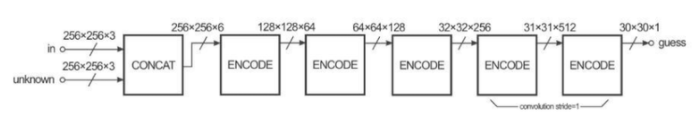

- 추가적으로 위 그림에서 최종 출력 크기가 (30,30,1)이 되어야 하는 이유
    - 앞서 Discriminator에 대해 알아봤던 70x70 PatchGAN을 사용함
    - 최종 (30,30) 출력에서 각 픽셀의 receptive field 크기를 (70,70)으로 맞추기 위함
    - Discriminator의 출력 크기를 (30,30) 크기로 강제로 맞추는 과정

In [ ]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)  # padding='valid' : 패딩을 하지 않음
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

- Padding : https://ardino.tistory.com/40

In [ ]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

In [ ]:
discriminator = Discriminator()
discriminator.get_summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_7 (Concatenate)    (None, 256, 256, 6)  0           ['input_2[0][0]',                
                                                                  'input_3[0][0]']          

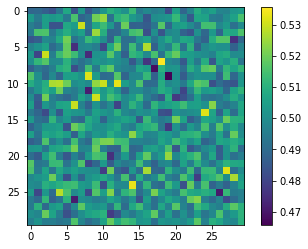

In [ ]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

- 임의의 (256,256,3) 크기의 입력을 넣어 (30,30) 출력을 시각화
- 각각의 픽셀 값은 sigmoid 함수의 결과값
    - 0~1 사이의 값
    - True, False를 판별

## 손실함수 정의

In [ ]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

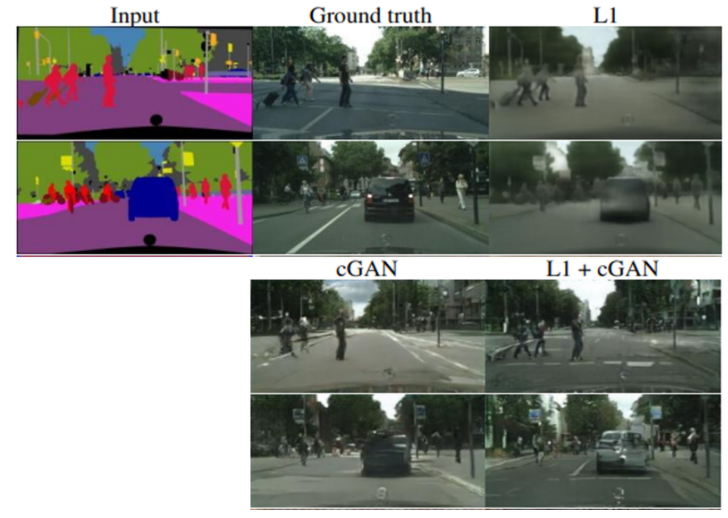

- 일반적인 GAN의 손실 함수에 L1을 추가로 이용했을 때 가장 실제에 가까운 이미지를 생성함
    - BinaryCrossentropy와 MAE를 구함

## Optimizer

In [ ]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

- beta_1
    - momentum과 관련
    - 디폴트 값 : 0.9
- beta_2
    - RMSProp과 관련
    - 디폴트 값 : 0.99

## Checkpoint 지정

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/Colab Notebooks/Exploration/Exploration.17_GAN_Pix2Pix_U-Net/checkpoint/ckpt03'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(gene_opt=gene_opt,
                                 disc_opt=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

## 모델 학습

### 1. 파라미터 업데이트 과정 구현
- 하나의 배치 크기만큼 데이터를 입력했을 때 가중치를 1회 업데이트하는 과정

In [ ]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

### 2. 모델 학습

In [ ]:
EPOCHS = 100
save_every = 50

In [ ]:
train_images

<BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

In [ ]:
# history = {'g_loss':[], 'l1_loss':[], 'd_loss':[], 'epoch':[]}

# for epoch in range(1, EPOCHS+1):
#     for i, (sketch, colored) in enumerate(train_images):
#         g_loss, l1_loss, d_loss = train_step(sketch, colored)

#         history['g_loss'].append(g_loss.numpy())
#         history['l1_loss'].append(l1_loss.numpy())
#         history['d_loss'].append(d_loss.numpy())
#         history['epoch'].append(epoch)
                
#         # 10회 반복마다 손실을 출력합니다.
#         if (i+1) % 10 == 0:
#             print(f"EPOCH[{epoch}] - STEP[{i+1}] \
#                     \nGenerator_loss:{g_loss.numpy():.4f} \
#                     \nL1_loss:{l1_loss.numpy():.4f} \
#                     \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

#     if (epoch + 1) % save_every == 0:
#       checkpoint.save(file_prefix=checkpoint_prefix)

## 체크포인트 불러오기

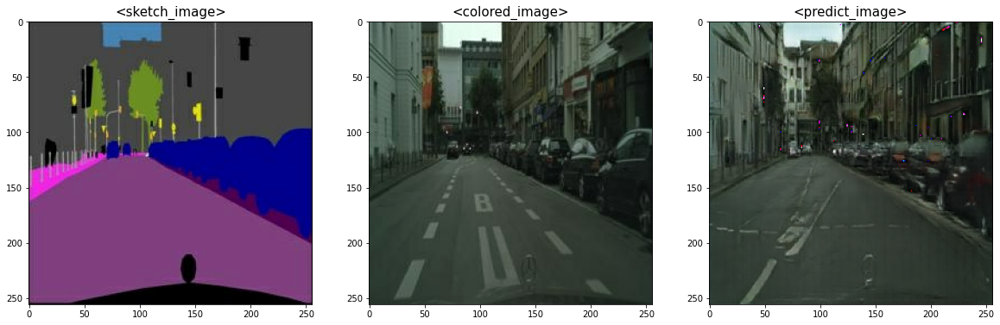

In [ ]:
checkpoint_load_dir = '/content/drive/MyDrive/Colab Notebooks/Exploration/Exploration.17_GAN_Pix2Pix_U-Net/checkpoint/ckpt02'

latest = tf.train.latest_checkpoint(checkpoint_load_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

test_ind = 1

f = file_path_train + os.listdir(file_path_train)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))

plt.subplot(1,3,1)
plt.title('<sketch_image>', fontsize=15)
plt.imshow(denormalize(sketch))

plt.subplot(1,3,2)
plt.title('<colored_image>', fontsize=15)
plt.imshow(denormalize(colored))

plt.subplot(1,3,3)
plt.title('<predict_image>', fontsize=15)
plt.imshow(pred[0])

- 체크포인트를 통해 학습 모델과 가중치를 잘 가져오는 것을 확인함
- 학습량
  - v.1.01 : 200번
  - v.2.01 : 100번
  - v.2.02 : 100번 추가 학습할 예정
- 버전별 이미지는 추후 보여줄 예정

## 모델 재학습

In [ ]:
history = {'g_loss':[], 'l1_loss':[], 'd_loss':[], 'epoch':[]}

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)

        history['g_loss'].append(g_loss.numpy())
        history['l1_loss'].append(l1_loss.numpy())
        history['d_loss'].append(d_loss.numpy())
        history['epoch'].append(epoch)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

    if (epoch + 1) % save_every == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)

- 학습 내용 출력이 너무 길어 삭제함

## 학습 결과 시각화

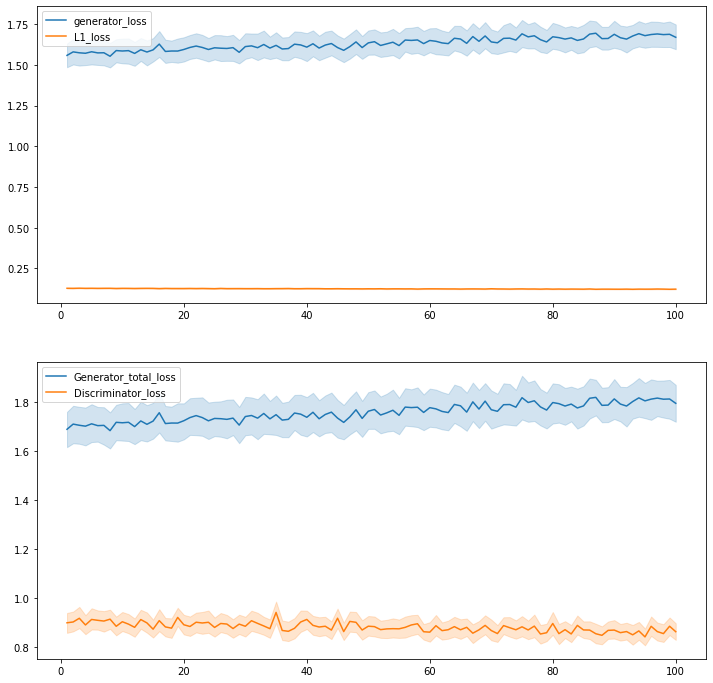

In [ ]:
gern_loss_total = [(history['g_loss'][i] + history['l1_loss'][i]) for i in range(len(history['g_loss']))]

plt.figure(figsize=(12, 12))

plt.subplot(2, 1, 1)
sns.lineplot(x=history['epoch'], y=history['g_loss'], label='generator_loss')
sns.lineplot(x=history['epoch'], y=history['l1_loss'], label='L1_loss')

plt.subplot(2, 1, 2)
sns.lineplot(x=history['epoch'], y=gern_loss_total, label='Generator_total_loss')
sns.lineplot(x=history['epoch'], y=history['d_loss'], label='Discriminator_loss')

- Generator loss는 점점 상승하고 Discriminator loss는 조금씩 떨어짐 (학습이 잘 되어가지 않는다는 의심을 하게됨)

## 테스트 결과 (채색)

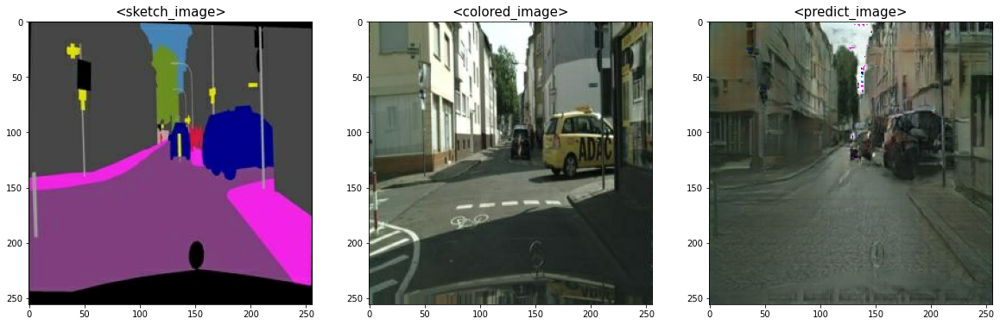

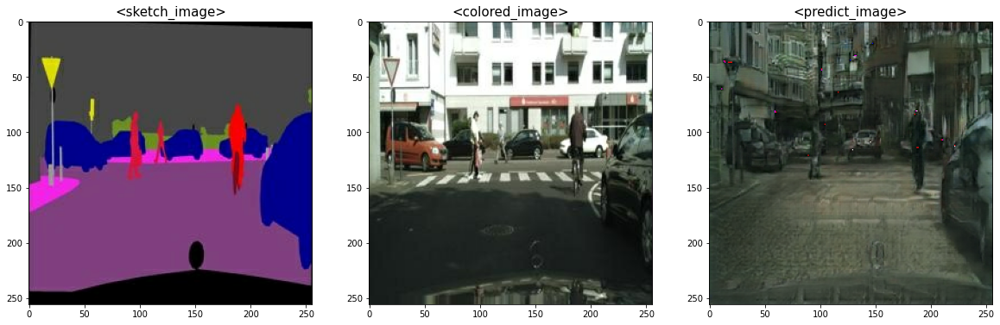

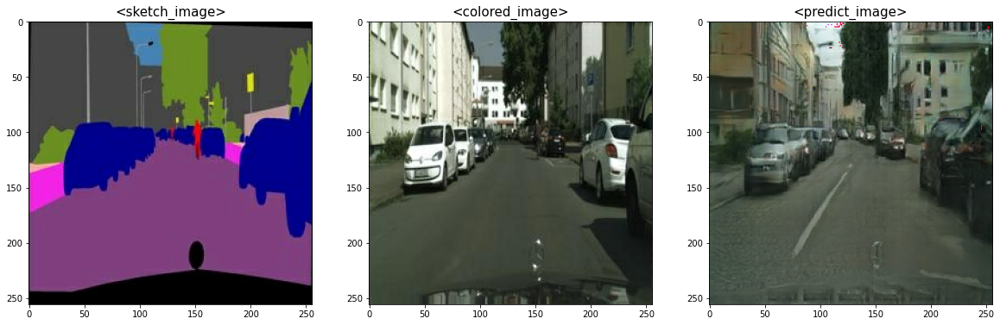

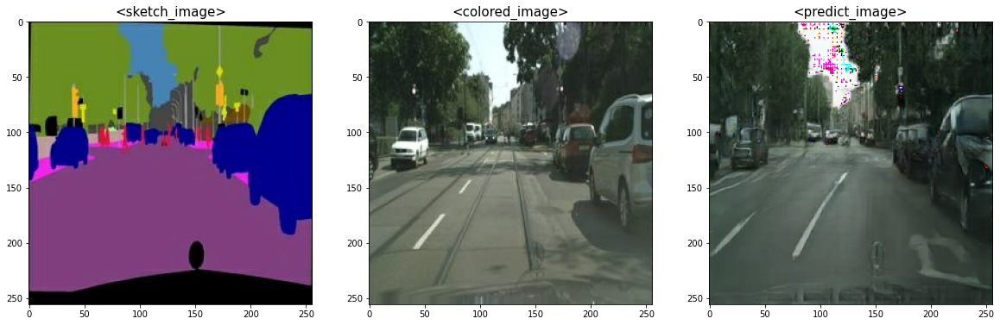

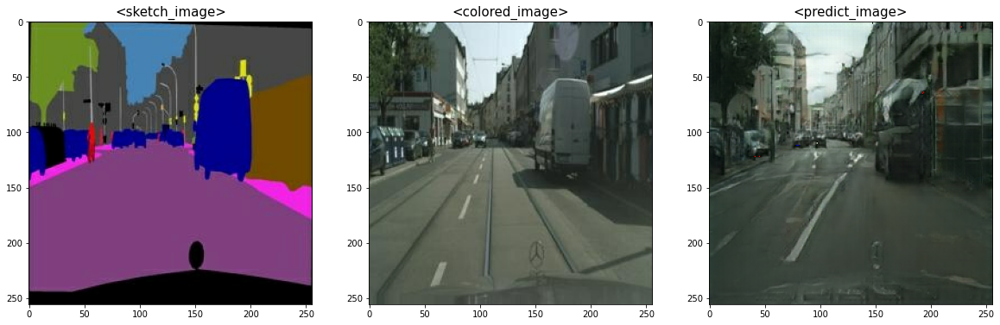

In [ ]:
for i in range(5):
  f = file_path_val + os.listdir(file_path_val)[i]
  sketch, colored = load_img(f)

  pred = generator(tf.expand_dims(sketch, 0))
  pred = denormalize(pred)

  plt.figure(figsize=(20,10))

  plt.subplot(1,3,1)
  plt.title('<sketch_image>', fontsize=15)
  plt.imshow(denormalize(sketch))

  plt.subplot(1,3,2)
  plt.title('<colored_image>', fontsize=15)
  plt.imshow(denormalize(colored))

  plt.subplot(1,3,3)
  plt.title('<predict_image>', fontsize=15)
  plt.imshow(pred[0])

- 채색 이미지(pridict image) 결과 성능이 잘 나왔다고 판단됨

## 버전별 이미지

### 1. v.1.01
- 학습량 epoch : 200번

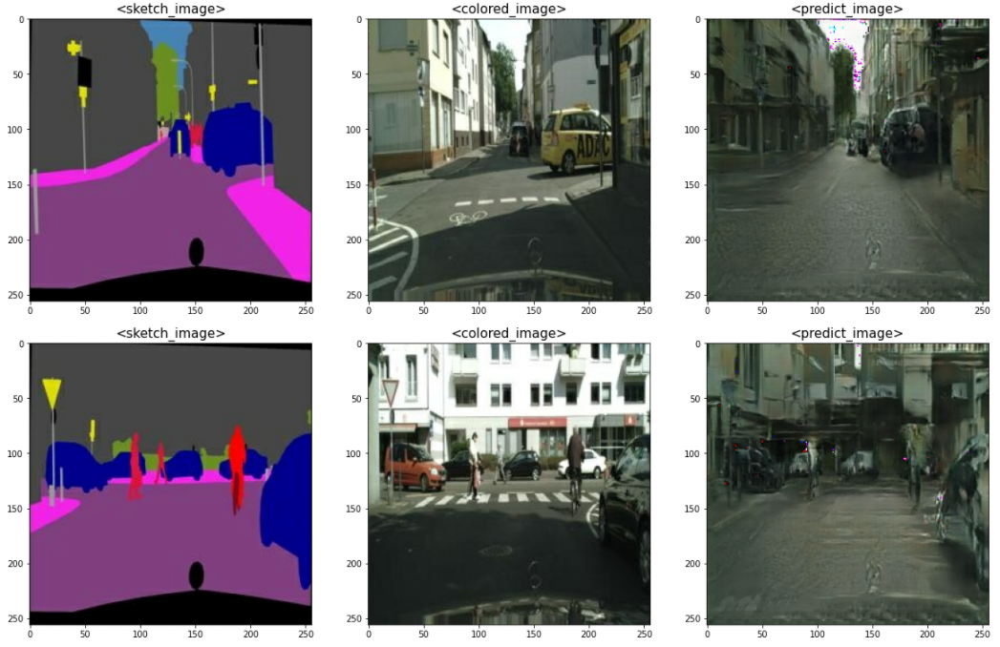

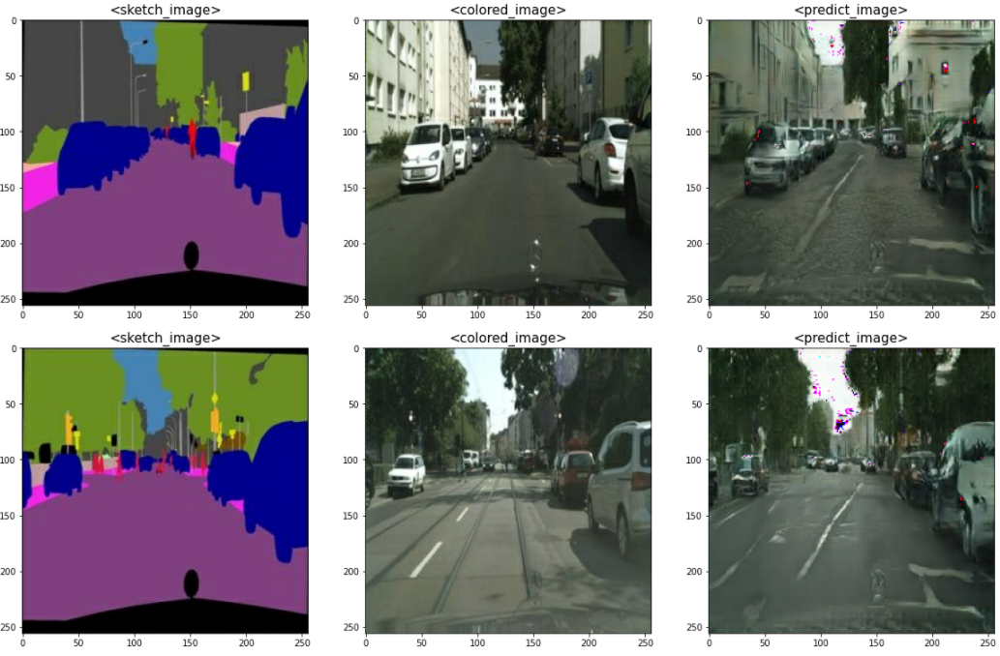

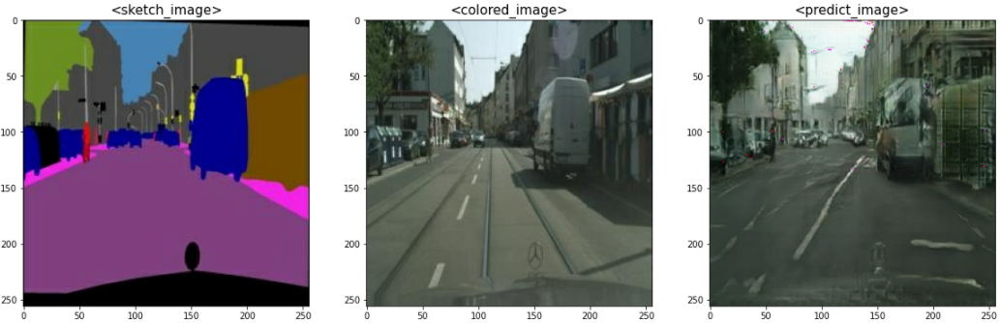

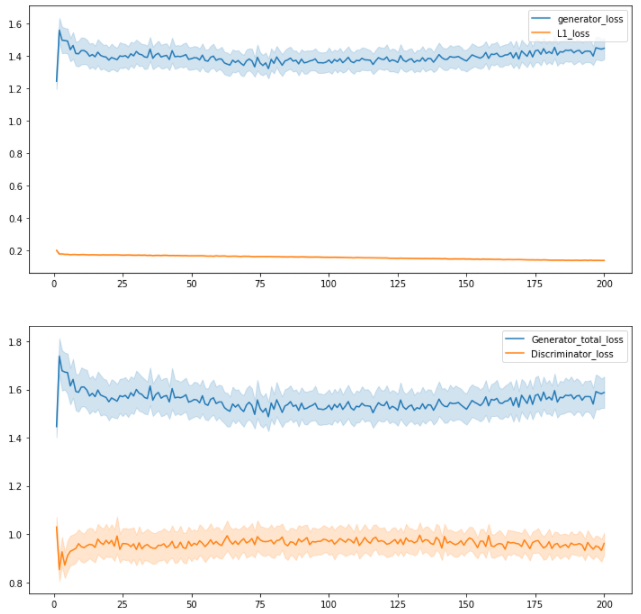

- v.1.01에서는 이미지가 흐릿하게 나옴
- Gererator loss는 높다가 점차 떨어지고 Discriminator loss는 낮은 상태에서 점차 올라감

### 2. v.2.01
- v.1.01에서 학습했던 모델과 가중치를 체크포인트로 불러와 추가 학습 시킴
- 학습량 epoch : 100번

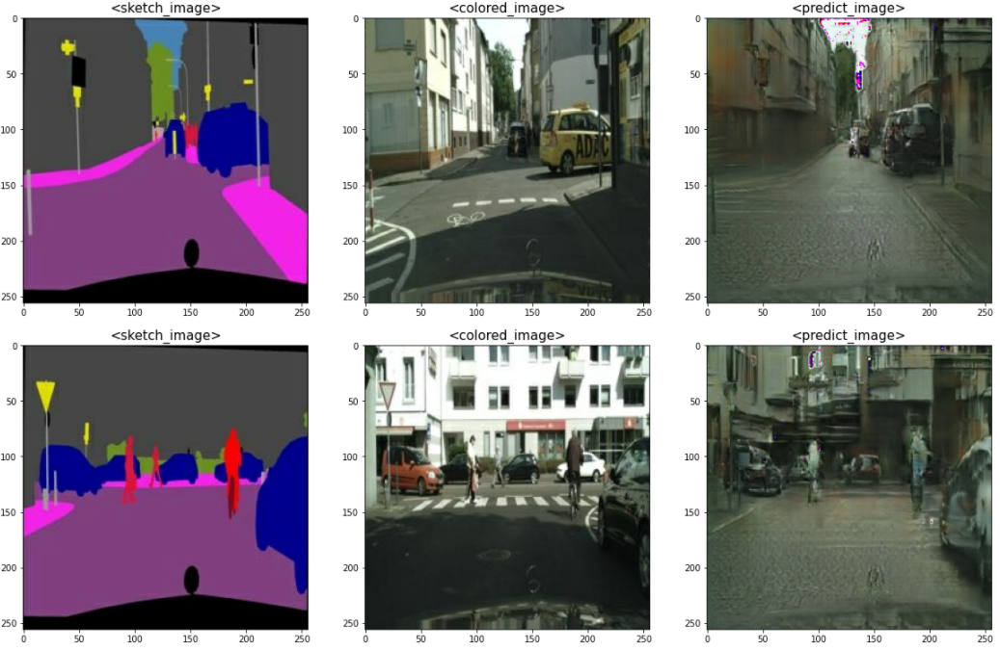

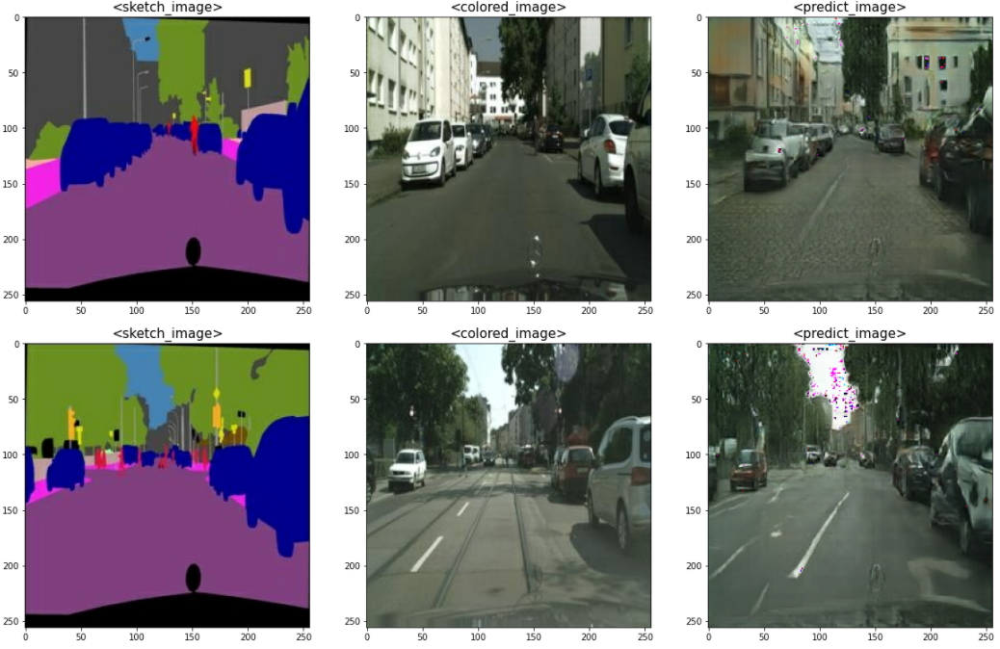

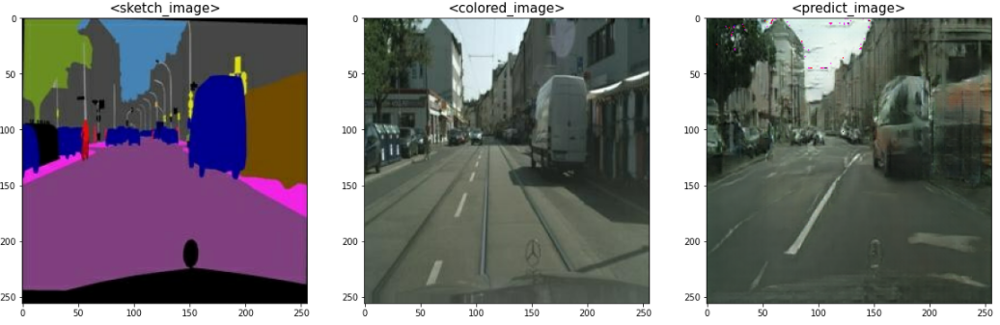

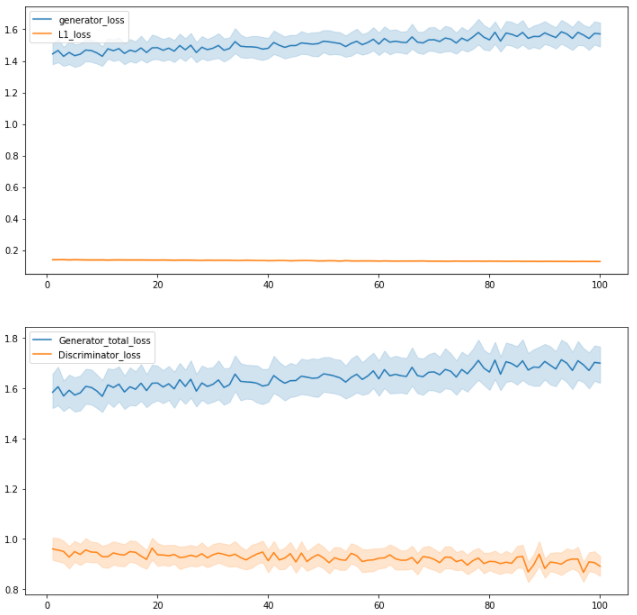

- 사람과 일부 차량이 투명하게 생성됨
- Generator loss는 올라가고 Discriminator loss는 조금씩 떨어짐

### 3. v.2.02 (본 파일의 버전)
- v.2.01에서 학습했던 모델과 가중치를 체크포인트로 불러와 추가 학습 시킴
- 학습량 epoch : 100번

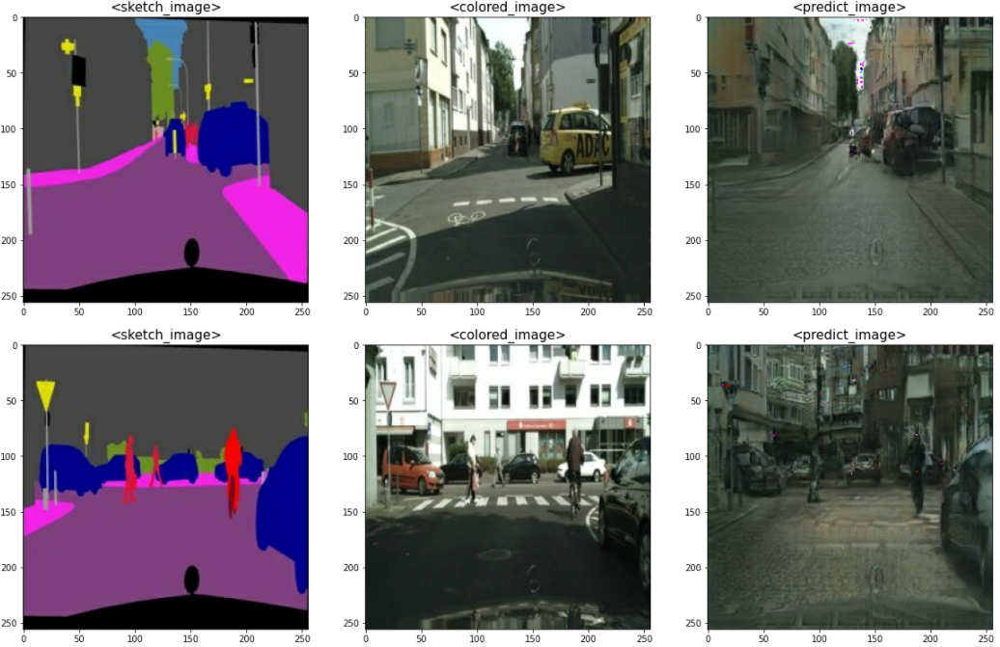

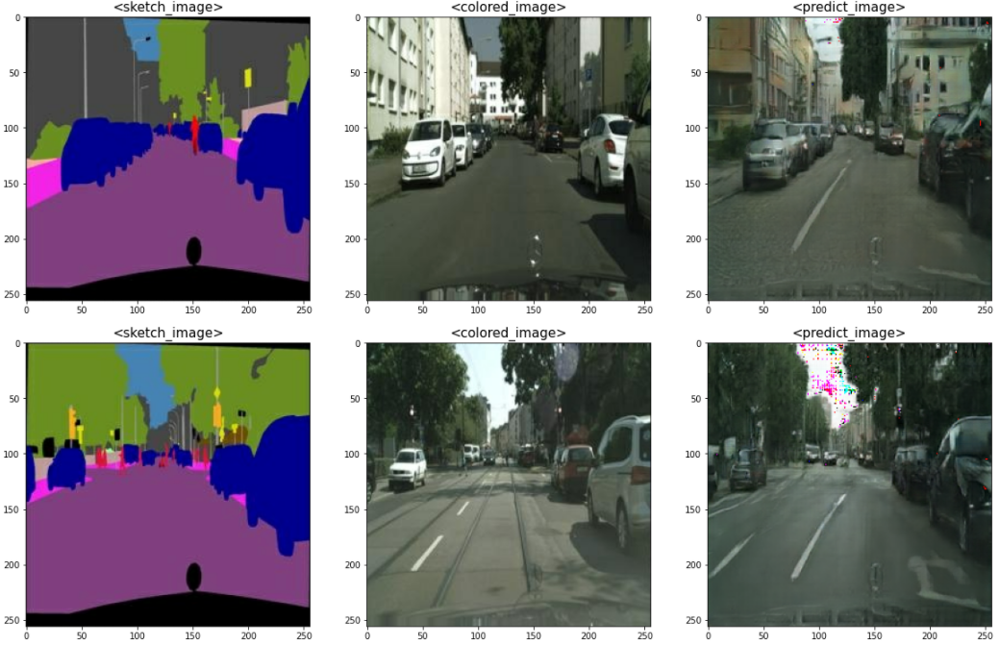

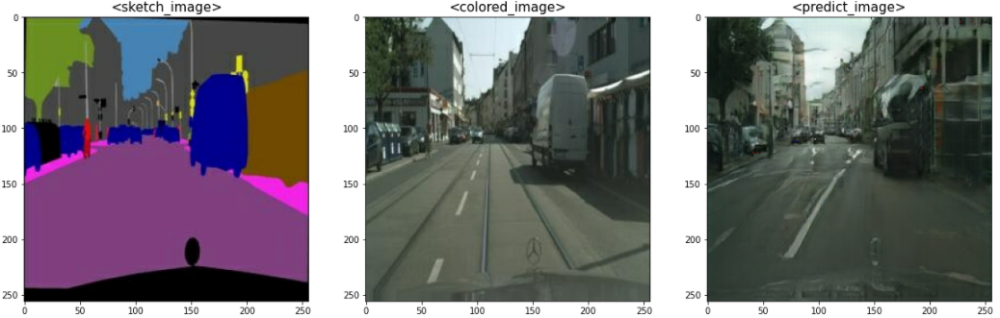

- 이미지가 잘 만들어진 것 같다고 판단됨

### 4. v.2.03
- v.2.02에서 학습했던 모델과 가중치를 체크포인트로 불러와 추가 학습 시킴
- 학습량 epoch : 100번

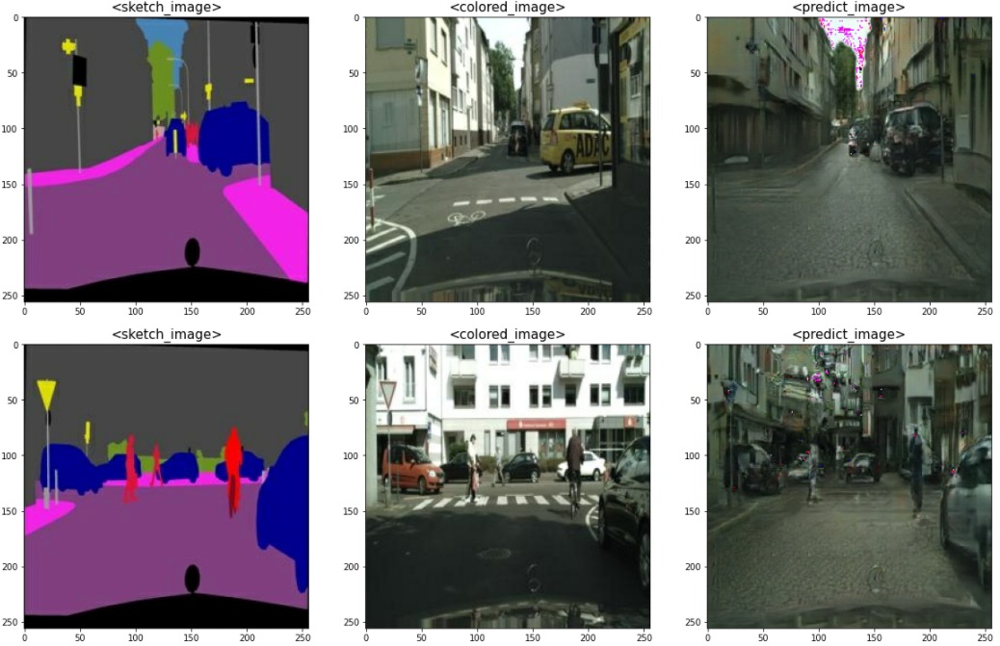

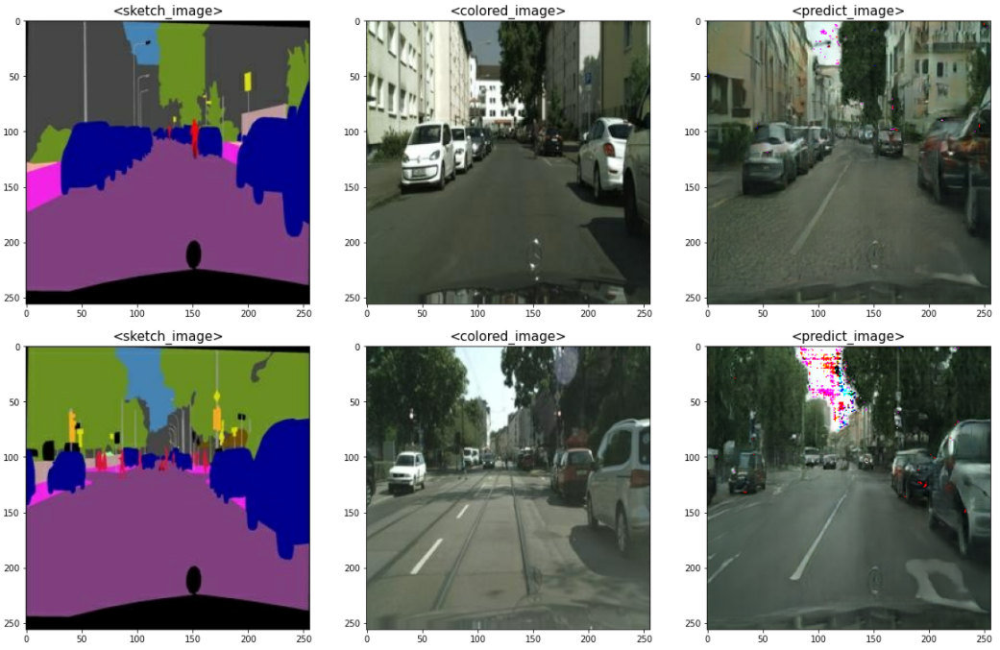

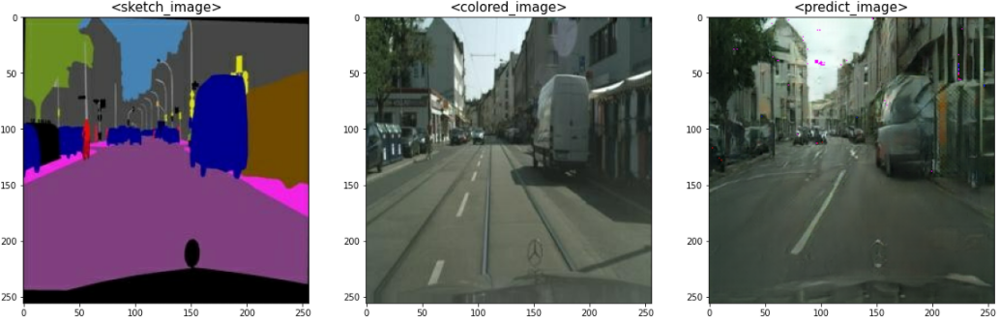

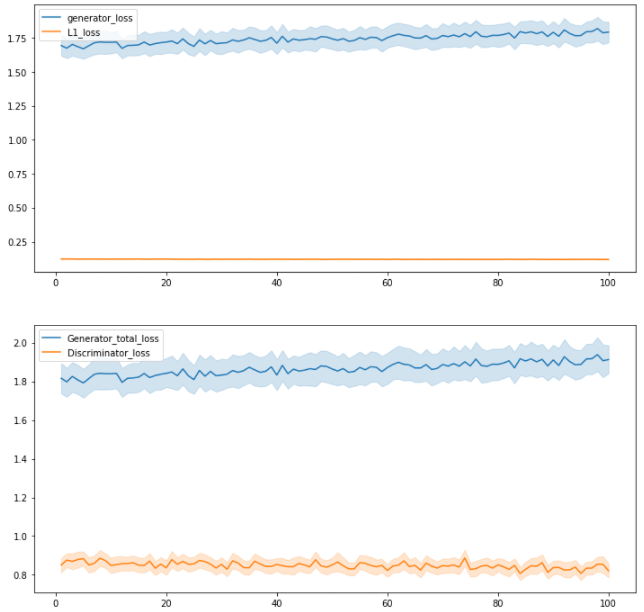

- v.2.02보다 이미지가 깨지는 느낌이 듦
  - 원색에 가까운 픽셀 늘어남
  - 일부 이미지는 뭉개지는 느낌이 듦
- Generator loss는 올라가고 Discriminator loss는 조금씩 떨어짐

## 결론
- v.2.02에서 가장 좋은 이미지가 나왔다고 판단됨
  - 총 epoch 400번
    - v.1.01 : 200번
    - v.2.01 : 100번
    - v.2.02 : 100번
- loss과 상관없이 이미지가 개선됨이 보여짐

## 회고

### 1. 새로 알아갔던 점
 - Pix2Pix를 처음 다뤄봄
 - U-Net의 구조를 접해봄

### 2. 흥미로웠던 점
 - 기존 실행해봤던 GAN보다 성능이 좋아서 흥미로웠음
 - Pix2Pix를 이용해서 이미지를 변환한 점 (이번에는 색상만 바꿔봤음)

### 3. 아쉬웠던 점
 - Generator, Discriminator의 Accuracy를 안봤다는 점

### 4. 앞으로의 다짐
 - 다른 GAN의 영역에도 도전해보고 싶음